In [112]:
# l'Hexagone in Hexagons; Jens Andersson 2021; https://jens-wirelesscar.medium.com/


# dataset from Arthur Charpentier's post at
#  https://freakonometrics.hypotheses.org/1125
# and specifically the CSV file at
#  http://freakonometrics.free.fr/popfr19752010.csv
# population for many different years for French "communes" (regional areas) with center points for each commune

# h3 plot helper functions with Folium from Abdullah Kurkcu's blog post at
#  https://betterprogramming.pub/playing-with-ubers-hexagonal-hierarchical-spatial-index-h3-ed8d5cd7739d
# which in turns says the source for the helper functions is
#  https://github.com/uber/h3-py-notebooks
# ...but i could not find the same helper functions there, and they needed some fixing to work with
# current versions of H3 and Folium. many thanks nevertheless!


Battle isle, circa 1991, Amiga

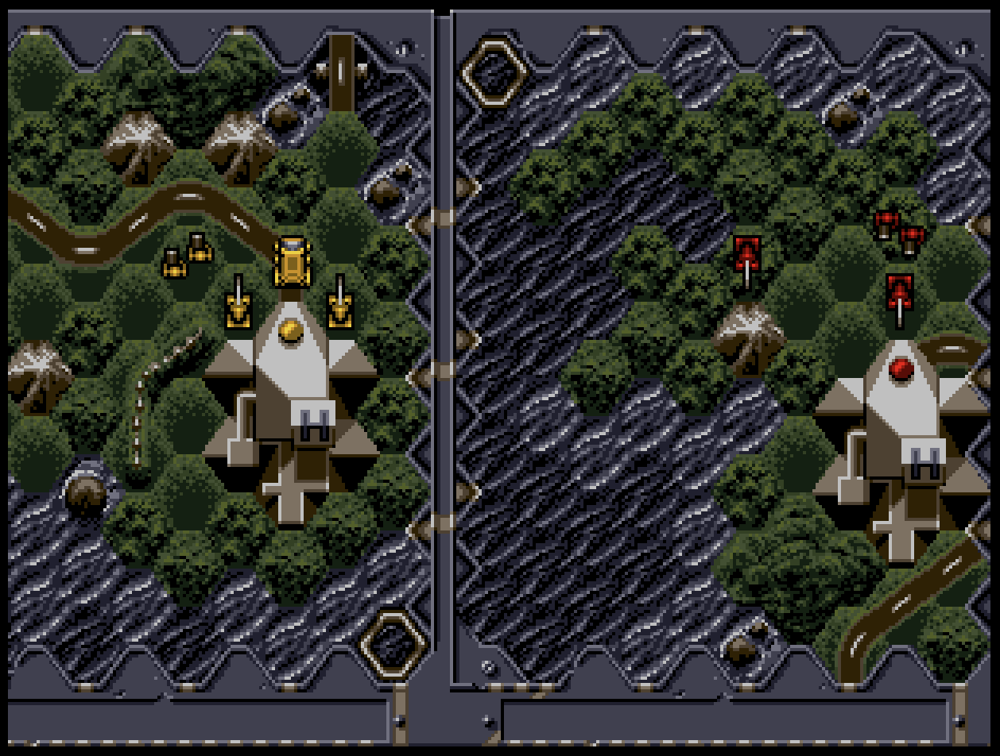

In [113]:
# this installation takes a while, only needed to be run once
!conda config --add channels conda-forge
!conda install -y h3-py folium geojson
# then you can comment it out if you want to keep it in the notebook

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.8.4
  latest version: 4.9.2

Please update conda by running

    $ conda update -n base -c defaults conda



# All requested packages already installed.



In [114]:
import pandas as pd

# it is supposedly possible to read CSV files directly from the web like this...
#url="http://freakonometrics.free.fr/popfr19752010.csv"
#dataset=pd.read_csv(url)

# but I placed the dataset in the Jupyter working directory and read it like this:
dataset=pd.read_csv("popfr19752010.csv")

In [115]:
dataset

,reg,dep,com,article,com_nom,long,lat,pop_1975,pop_1976,pop_1977,...,pop_2001,pop_2002,pop_2003,pop_2004,pop_2005,pop_2006,pop_2007,pop_2008,pop_2009,pop_2010
0,11,75,56,NaN,PARIS,2.352222,48.856614,2.294116e+06,2.277408e+06,2.261510e+06,...,2.142425e+06,2.149205e+06,2.156989e+06,2.165785e+06,2.175600e+06,2.186440e+06,2.198315e+06,2.211230e+06,2.225194e+06,2.240213e+06
1,11,77,1,NaN,ACHERES-LA-FORET,2.570289,48.354976,6.482592e+02,6.620875e+02,6.763429e+02,...,1.106389e+03,1.126294e+03,1.146224e+03,1.166163e+03,1.186095e+03,1.206006e+03,1.225880e+03,1.245702e+03,1.265455e+03,1.285127e+03
2,11,77,10,NaN,AUBEPIERRE-OZOUER-LE-REPOS,2.890552,48.632323,5.874394e+02,5.995405e+02,6.118238e+02,...,8.738642e+02,8.797754e+02,8.849946e+02,8.894883e+02,8.932229e+02,8.961646e+02,8.982798e+02,8.995351e+02,8.998966e+02,8.993365e+02
3,11,77,100,LE,CHATELET-EN-BRIE,2.792095,48.504945,2.251402e+03,2.481846e+03,2.695300e+03,...,4.408286e+03,4.407891e+03,4.407379e+03,4.407398e+03,4.408599e+03,4.411630e+03,4.417140e+03,4.425779e+03,4.438194e+03,4.454928e+03
4,11,77,101,NaN,CHATENAY-SUR-SEINE,3.096229,48.418774,5.071603e+02,5.391894e+02,5.699313e+02,...,9.284420e+02,9.278621e+02,9.260636e+02,9.230492e+02,9.188215e+02,9.133832e+02,9.067369e+02,8.988853e+02,8.898310e+02,8.795762e+02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36313,94,202,9,NaN,ALERIA,9.512429,42.104248,2.896324e+03,2.805077e+03,2.719691e+03,...,1.958147e+03,1.960450e+03,1.963906e+03,1.968334e+03,1.973553e+03,1.979382e+03,1.985639e+03,1.992144e+03,1.998716e+03,2.005203e+03
36314,94,202,93,NaN,CORBARA,8.907482,42.615508,3.705624e+02,3.927481e+02,4.133586e+02,...,7.504670e+02,7.710737e+02,7.932551e+02,8.171326e+02,8.428271e+02,8.704600e+02,9.001522e+02,9.320250e+02,9.661996e+02,1.002777e+03
36315,94,202,95,NaN,CORSCIA,9.042592,42.354646,2.829746e+02,2.773087e+02,2.712864e+02,...,1.432567e+02,1.437537e+02,1.451288e+02,1.474294e+02,1.507030e+02,1.549970e+02,1.603590e+02,1.668365e+02,1.744768e+02,1.833197e+02
36316,94,202,96,NaN,CORTE,9.149022,42.309409,5.223613e+03,5.186141e+03,5.161227e+03,...,6.492304e+03,6.551535e+03,6.604940e+03,6.651811e+03,6.691440e+03,6.723122e+03,6.746148e+03,6.759812e+03,6.763406e+03,6.756341e+03


In [116]:
dataset.describe()

,reg,dep,com,long,lat,pop_1975,pop_1976,pop_1977,pop_1978,pop_1979,...,pop_2001,pop_2002,pop_2003,pop_2004,pop_2005,pop_2006,pop_2007,pop_2008,pop_2009,pop_2010
count,36318.000000,36318.000000,36318.000000,36318.000000,36318.000000,3.631800e+04,3.631800e+04,3.631800e+04,3.631800e+04,3.631800e+04,...,3.631800e+04,3.631800e+04,3.631800e+04,3.631800e+04,3.631800e+04,3.631800e+04,3.631800e+04,3.631800e+04,3.631800e+04,3.631800e+04
mean,49.644969,47.574453,251.244755,2.732537,46.973237,1.446755e+03,1.455133e+03,1.463207e+03,1.470994e+03,1.478521e+03,...,1.635056e+03,1.644360e+03,1.654080e+03,1.664244e+03,1.674881e+03,1.686018e+03,1.697685e+03,1.709908e+03,1.722717e+03,1.736135e+03
std,25.363154,29.592749,180.946130,2.657415,2.210865,1.488296e+04,1.477034e+04,1.466529e+04,1.456763e+04,1.447717e+04,...,1.412941e+04,1.418188e+04,1.423971e+04,1.430282e+04,1.437118e+04,1.444478e+04,1.452361e+04,1.460770e+04,1.469710e+04,1.479191e+04
min,11.000000,1.000000,1.000000,-5.097626,41.387174,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
25%,25.000000,25.000000,106.000000,0.666670,45.164214,1.657071e+02,1.665941e+02,1.677070e+02,1.682949e+02,1.688806e+02,...,1.795870e+02,1.810448e+02,1.824686e+02,1.841070e+02,1.858505e+02,1.877576e+02,1.895702e+02,1.917419e+02,1.938557e+02,1.957946e+02
50%,43.000000,49.000000,218.000000,2.624225,47.390143,3.338508e+02,3.381541e+02,3.414386e+02,3.439452e+02,3.462345e+02,...,3.907489e+02,3.945034e+02,3.982375e+02,4.029527e+02,4.069628e+02,4.111323e+02,4.160923e+02,4.213762e+02,4.273289e+02,4.326952e+02
75%,73.000000,67.000000,361.000000,4.850850,48.836580,7.528022e+02,7.620948e+02,7.759058e+02,7.876871e+02,7.996927e+02,...,9.554295e+02,9.662275e+02,9.766085e+02,9.846889e+02,9.968289e+02,1.008801e+03,1.022184e+03,1.035528e+03,1.049666e+03,1.065215e+03
max,94.000000,202.000000,909.000000,9.530300,51.070883,2.294116e+06,2.277408e+06,2.261510e+06,2.246430e+06,2.232175e+06,...,2.142425e+06,2.149205e+06,2.156989e+06,2.165785e+06,2.175600e+06,2.186440e+06,2.198315e+06,2.211230e+06,2.225194e+06,2.240213e+06


In [117]:
# we focus only on latitudes/longitudes and the year 2001 population numbers for now, so we skip all else
dataset2001 = dataset[['com_nom', 'lat', 'long', 'pop_2001']]

dataset2001.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36318 entries, 0 to 36317
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   com_nom   36318 non-null  object 
 1   lat       36318 non-null  float64
 2   long      36318 non-null  float64
 3   pop_2001  36318 non-null  float64
dtypes: float64(3), object(1)
memory usage: 1.1+ MB


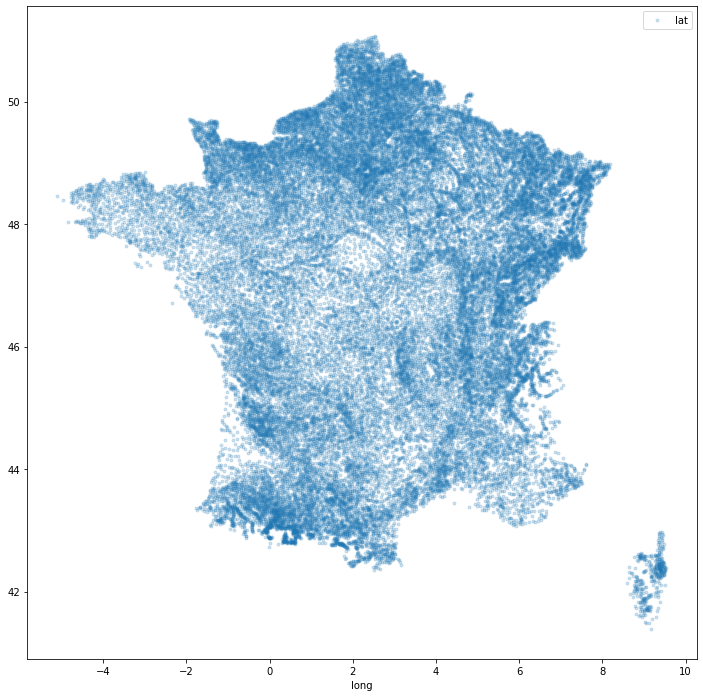

In [118]:
# Standard plot: all commune center points (there's a lot of them)
dataset2001.plot(x='long',y='lat',style='.',alpha=0.2,figsize=(12,12));

In [119]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt

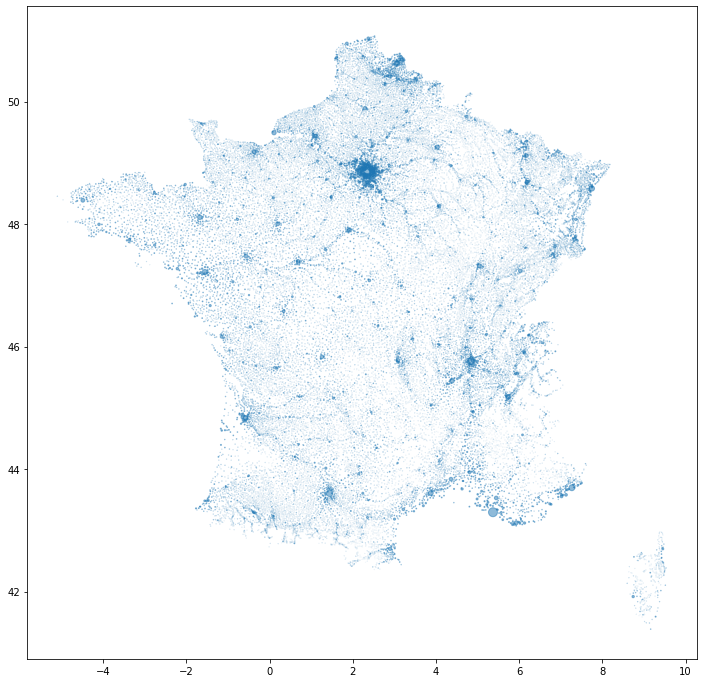

In [120]:
plt.figure(figsize=(12,12))
plt.scatter(dataset2001['long'], dataset2001['lat'], dataset['pop_2001']*0.0001, alpha=0.5)
plt.show()

In [121]:
import h3

In [122]:
# demonstration and check that H3 is actually working; expected to print '831f90fffffffff'
lat, lng, res= 46, 4, 3
h3.geo_to_h3(lat, lng, res)

'831f90fffffffff'

In [123]:
######### Time for the actual H3 usage with the dataset #########

In [124]:
# for all data points with lat/long, we add the corresponding hex_id
# (not unique here, many communes will fall in the same hexagon)

# lower resolutions = larger hexagons; something like 3-6 is a reasonable range
resolution = 5
hex_ids = dataset2001.apply(lambda row: h3.geo_to_h3(row.lat, row.long, resolution), axis = 1)
dataset2001 = dataset2001.assign(hex_id=hex_ids.values)


In [125]:
hex_ids.nunique()

2435

In [126]:
dataset2001["hex_id"].nunique()

2435

In [127]:
# sum up the populations per hex_id
dataset2001byhexid = dataset2001.groupby("hex_id", as_index=False).agg({"pop_2001": "sum"})

In [128]:
dataset2001byhexid.columns = ["hex_id", "value"]
dataset2001byhexid

,hex_id,value
0,85184093fffffff,4130.339411
1,85184097fffffff,722.625886
2,85184403fffffff,16271.269127
3,85184407fffffff,20255.715794
4,8518440bfffffff,13705.833649
...,...,...
2430,8539759bfffffff,99.041374
2431,853975a3fffffff,442.834320
2432,853975a7fffffff,2553.567938
2433,853975b3fffffff,6221.554329


In [129]:
# map populations per hexagon to percentiles instead, to ensure we get good use of our colour range!
import scipy.stats as scs

In [130]:
dataset2001byhexid["percentile"] = \
  [scs.percentileofscore(dataset2001byhexid["value"].values, i) for i in dataset2001byhexid["value"].values]

In [131]:
dataset2001byhexid

,hex_id,value,percentile
0,85184093fffffff,4130.339411,21.437372
1,85184097fffffff,722.625886,2.094456
2,85184403fffffff,16271.269127,70.554415
3,85184407fffffff,20255.715794,77.412731
4,8518440bfffffff,13705.833649,64.106776
...,...,...,...
2430,8539759bfffffff,99.041374,0.164271
2431,853975a3fffffff,442.834320,1.355236
2432,853975a7fffffff,2553.567938,11.088296
2433,853975b3fffffff,6221.554329,34.661191


In [132]:
dataset2001byhexid

,hex_id,value,percentile
0,85184093fffffff,4130.339411,21.437372
1,85184097fffffff,722.625886,2.094456
2,85184403fffffff,16271.269127,70.554415
3,85184407fffffff,20255.715794,77.412731
4,8518440bfffffff,13705.833649,64.106776
...,...,...,...
2430,8539759bfffffff,99.041374,0.164271
2431,853975a3fffffff,442.834320,1.355236
2432,853975a7fffffff,2553.567938,11.088296
2433,853975b3fffffff,6221.554329,34.661191


In [133]:
# do we actually need to sort them?
dataset2001byhexid.sort_values(by = "value", ascending = False, inplace = True)
dataset2001byhexid

,hex_id,value,percentile
1840,851fb467fffffff,3.373257e+06,100.000000
1844,851fb477fffffff,1.369304e+06,99.958932
1827,851fb42bfffffff,9.777216e+05,99.917864
1839,851fb463fffffff,8.905457e+05,99.876797
2275,85396817fffffff,8.558377e+05,99.835729
...,...,...,...
1513,851f9e43fffffff,1.145640e+02,0.205339
2430,8539759bfffffff,9.904137e+01,0.164271
1490,851f9a9bfffffff,8.499694e+01,0.123203
1600,851fa62bfffffff,7.764311e+01,0.082136


In [134]:
import folium
from geojson import Feature, Point, FeatureCollection
import json

In [135]:
def hexagons_dataframe_to_geojson(df_hex, file_output = None, column_name = "value"):
    """
    Produce the GeoJSON for a dataframe, constructing the geometry from the "hex_id" column
    and with a property matching the one in column_name
    """    
    list_features = []
    
    for i,row in df_hex.iterrows():
        try:
            geometry_for_row = { "type" : "Polygon", "coordinates": [h3.h3_to_geo_boundary(h=row["hex_id"],geo_json=True)]}
            feature = Feature(geometry = geometry_for_row , id=row["hex_id"], properties = {column_name : row[column_name]})
            list_features.append(feature)
        except:
            print("An exception occurred for hex " + row["hex_id"]) 

    feat_collection = FeatureCollection(list_features)
    geojson_result = json.dumps(feat_collection)
    return geojson_result

def get_color(custom_cm, val, vmin, vmax):
    return matplotlib.colors.to_hex(custom_cm((val-vmin)/(vmax-vmin)))

def choropleth_map(df_aggreg, column_name = "value", border_color = 'black', fill_opacity = 0.7, color_map_name = "Blues", initial_map = None):
    """
    Creates choropleth maps given the aggregated data. initial_map can be an existing map to draw on top of.
    """    
    #colormap
    min_value = df_aggreg[column_name].min()
    max_value = df_aggreg[column_name].max()
    mean_value = df_aggreg[column_name].mean()
    print(f"Colour column min value {min_value}, max value {max_value}, mean value {mean_value}")
    print(f"Hexagon cell count: {df_aggreg['hex_id'].nunique()}")
    
    # the name of the layer just needs to be unique, put something silly there for now:
    name_layer = "Choropleth " + str(df_aggreg)
    
    if initial_map is None:
        initial_map = folium.Map(location= [47, 4], zoom_start=5.5, tiles="cartodbpositron")

    #create geojson data from dataframe
    geojson_data = hexagons_dataframe_to_geojson(df_hex = df_aggreg, column_name = column_name)

    # color_map_name 'Blues' for now, many more at https://matplotlib.org/stable/tutorials/colors/colormaps.html to choose from!
    custom_cm = matplotlib.cm.get_cmap(color_map_name)

    folium.GeoJson(
        geojson_data,
        style_function=lambda feature: {
            'fillColor': get_color(custom_cm, feature['properties'][column_name], vmin=min_value, vmax=max_value),
            'color': border_color,
            'weight': 1,
            'fillOpacity': fill_opacity 
        }, 
        name = name_layer
    ).add_to(initial_map)

    return initial_map

In [136]:
hexmap = choropleth_map(df_aggreg = dataset2001byhexid, color_map_name = "Blues", column_name = "value")
hexmap

Colour column min value 48.9324359881656, max value 3373256.9397110203, mean value 24386.85069181827
Hexagon cell count: 2435


In [137]:
hexmap = choropleth_map(df_aggreg = dataset2001byhexid, color_map_name = "Blues", column_name = "percentile")
hexmap

Colour column min value 0.04106776180698152, max value 100.0, mean value 50.02053388090349
Hexagon cell count: 2435


The above should look like this image: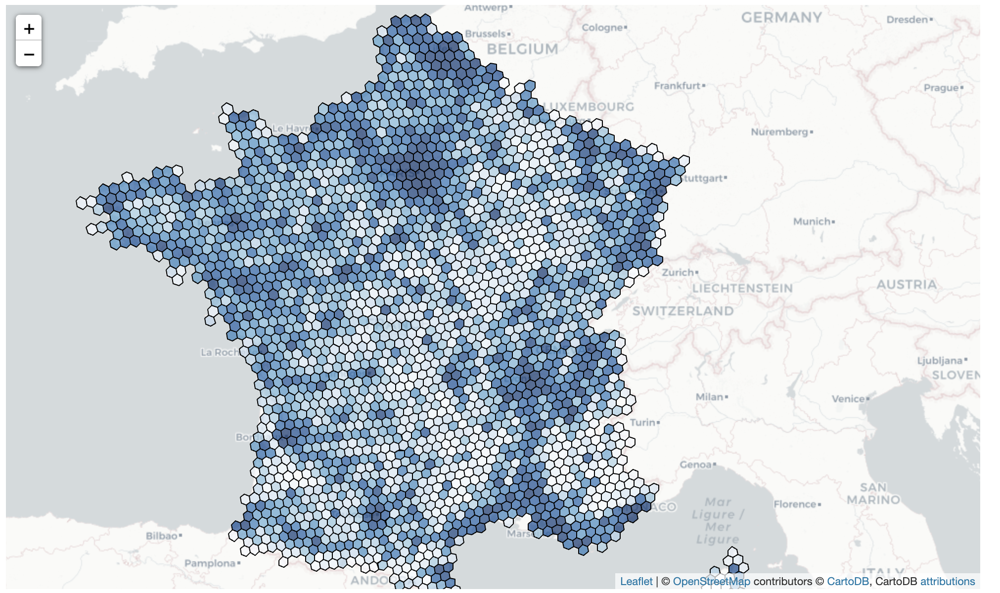

In [138]:
##########

In [139]:
# also, another fun experiment: H3 can compact a set of cells to make use of larger cells where possible.
# this is guaranteed to be reversible as it operates on the cell level, which always have a single parent
# (even when they do not fully fall within one possible parent cell)
compactedCells = h3.compact(dataset2001byhexid['hex_id'])

In [140]:
# we started out with this many cells...
dataset2001byhexid['hex_id'].nunique()

2435

In [141]:
# and they got reduced to this many:
len(compactedCells)

389

In [142]:
dataset2001byhexid_compacted = dataset2001byhexid.copy()

In [143]:
# given hex id hid, find out if it already exists in setOfHexes, or if not, recursively check if the parent does
# (to a max level of 4, for now)

# there must be a simpler way of doing this with built-in h3 functionality?
def findSmallestInSet(hid, setOfHexes, depth=0):
    if hid in setOfHexes or depth > 4:
        return hid
    else:
        parentHex = h3.h3_to_parent(hid)
        return findSmallestInSet(parentHex, setOfHexes, depth=depth+1)

In [144]:
# translate the hex ids we had to whatever larger hex id they are a part of, from the compacted set
dataset2001byhexid_compacted['hex_id'] = \
  dataset2001byhexid_compacted['hex_id'].map(lambda hid: findSmallestInSet(hid, compactedCells, depth=0))

In [145]:
# since we changed hex ids now, we need to recalculate the values
# (let's take the mean, although it might not be a meaningful value in this case, being a mean of percentiles)
dataset2001byhexid_compacted = dataset2001byhexid_compacted.groupby('hex_id', as_index=False).agg({"percentile": "mean"})

In [146]:
dataset2001byhexid_compacted

,hex_id,percentile
0,821f97fffffffff,47.677277
1,821fb7fffffffff,50.879365
2,831861fffffffff,55.095336
3,831863fffffffff,62.961069
4,831865fffffffff,63.650840
...,...,...
384,8539759bfffffff,0.164271
385,853975a3fffffff,1.355236
386,853975a7fffffff,11.088296
387,853975b3fffffff,34.661191


In [147]:
hexmap_compacted = choropleth_map(df_aggreg = dataset2001byhexid_compacted, column_name = "percentile")
hexmap_compacted

Colour column min value 0.04106776180698152, max value 99.83572895277207, mean value 49.55859289136861
Hexagon cell count: 389


The above should look something like this:
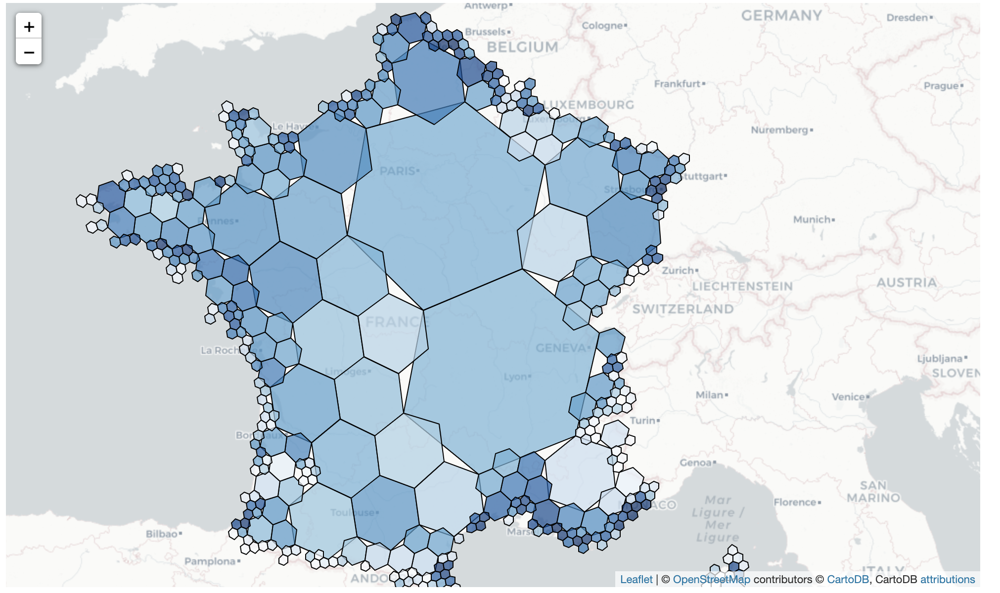

In [148]:
both_hexmaps = choropleth_map(df_aggreg = dataset2001byhexid_compacted, column_name = "percentile", color_map_name = "Greens", fill_opacity = 0.4, initial_map = hexmap)
both_hexmaps

Colour column min value 0.04106776180698152, max value 99.83572895277207, mean value 49.55859289136861
Hexagon cell count: 389


The above should look something like:
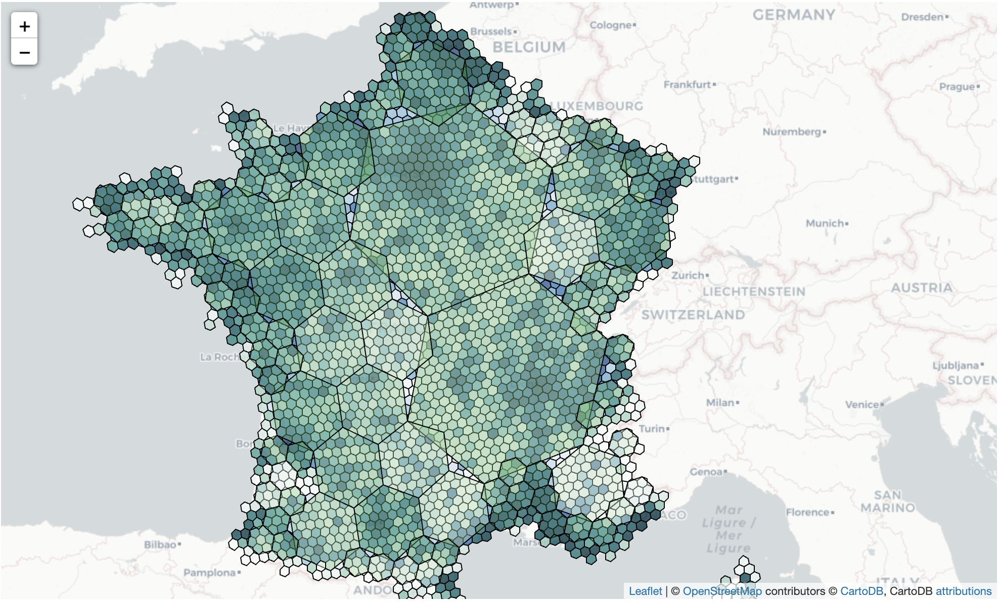